# First Python Notebook Assignment
The purpose of this notebook is to recapitualte the basic principles of data visualization, data preprocessing and model parameter optimization. This notebook needs to be done individually and uploaded until **May, 17th 11:30 PM** on moodle (If we find copy/pasted solutions in a notebook we will drop ALL points). Consecutively there will be a peer review that must be done until **May, 24th 11:30 PM** .

Do not include your Name or Matriculation Number in this Notebook or in the filename!

Each subtask correctly edited/answered gives 1 point. Each subtask that is not edited or wrong gives 0 points. The maximum number of points that can be achieved in this notebook is 25. (Note: Those points are counted for the submission part only, not the review part.)

You are allowed to use the python libraries: _Pandas, Numpy, Scipy, Seaborn, Matplotlib and Sklearn_. Do not import any other libraries! Classes and functions of the mentioned libraries can be imported anytime!

Alongside with the notebook and the dataset, we will also release the requirements to run this notebook properly. If you struggle setting up your (virtual) python environment contact us [ami@ldv.ei.tum.de](mailto:ami@ldv.ei.tum.de).

In [3]:
import pandas as pd
import numpy as np
import scipy as sp
from scipy.stats import loguniform
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, KFold, GridSearchCV

from sklearn.metrics import mean_squared_error, r2_score

from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.compose import TransformedTargetRegressor
from sklearn.pipeline import Pipeline

from sklearn.linear_model import Ridge

%matplotlib inline
sns.set_style('whitegrid')
from IPython.display import set_matplotlib_formats
%config InlineBackend.figure_formats = ['svg']

In [4]:
data = pd.read_csv('student-mat.csv')

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 395 entries, 0 to 394
Data columns (total 33 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   school      395 non-null    object
 1   sex         395 non-null    object
 2   age         395 non-null    int64 
 3   address     395 non-null    object
 4   famsize     395 non-null    object
 5   Pstatus     395 non-null    object
 6   Medu        395 non-null    int64 
 7   Fedu        395 non-null    int64 
 8   Mjob        395 non-null    object
 9   Fjob        395 non-null    object
 10  reason      395 non-null    object
 11  guardian    395 non-null    object
 12  traveltime  395 non-null    int64 
 13  studytime   395 non-null    int64 
 14  failures    395 non-null    int64 
 15  schoolsup   395 non-null    object
 16  famsup      395 non-null    object
 17  paid        395 non-null    object
 18  activities  395 non-null    object
 19  nursery     395 non-null    object
 20  higher    

In [5]:
data.describe()

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
count,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000
mean,16.696203,2.749367,2.521519,1.448101,2.035443,0.334177,3.944304,3.235443,3.108861,1.481013,2.291139,3.554430,5.708861,10.908861,10.713924,10.415190
std,1.276043,1.094735,1.088201,0.697505,0.839240,0.743651,0.896659,0.998862,1.113278,0.890741,1.287897,1.390303,8.003096,3.319195,3.761505,4.581443
min,15.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,3.000000,0.000000,0.000000
25%,16.000000,2.000000,2.000000,1.000000,1.000000,0.000000,4.000000,3.000000,2.000000,1.000000,1.000000,3.000000,0.000000,8.000000,9.000000,8.000000
50%,17.000000,3.000000,2.000000,1.000000,2.000000,0.000000,4.000000,3.000000,3.000000,1.000000,2.000000,4.000000,4.000000,11.000000,11.000000,11.000000
75%,18.000000,4.000000,3.000000,2.000000,2.000000,0.000000,5.000000,4.000000,4.000000,2.000000,3.000000,5.000000,8.000000,13.000000,13.000000,14.000000
max,22.000000,4.000000,4.000000,4.000000,4.000000,3.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,75.000000,19.000000,19.000000,20.000000


### Task 1: Visualization

Utilize two *different types* of plots. You are free to use `matplotlib`, `pandas` or `seaborn` for plotting but no other python modules! Take care of axes labeling and (if neccessary) legends, as well as properly labelled xticks or yticks. _(Note: Different types of plots does not mean using the same plot twice with different variables.)_

**1.1.** Use the cell below to write your code for the first plot(s)!

In [23]:
#your code for the first plot goes here! Take care that you import all classes/functions you need. Do not use different modules than matplotlib, pandas, seaborn for plotting
sns.pairplot(data, kind="kde")

**1.2.** Use the Markdown-cell below to briefly justify your choice!

I choose to plot first pair plot between all numeric predictors and each other, also with respect to dependent variable (G3). The reason is to view at the beginning as much relations as possible between all numeric features. We can also spot possible hints or cues to which ones are of more importance than others and which ones are hugely correlated to each other.

**1.3.** Use the Markdown-cell below to briefely discuss your plot!

First thing to observe is the very high correlation between G1, G2 and G3. The relation between G1 and G2 for example, is showing small outliers which can be understood to be people who attended G1 but failed/absent in G2. Similarily the relation with G3 can be understood. Also the relation between Mother and Father eduction is highly correlated and we can treat one of them as redundant. More students seem to have less travel time but G3 looks to be almost uniformly distributed for all ranges of travel times. A slight inverse-correlation between failures and G3 grade is also observer, however the data samples seem to be right-skewed with most students having 0 failures. Although Dalc and absences data samples seem to have almost similar KDE shape, there is no logical connection between both predictors to assume redundancy.   

**1.4.** Use the cell below to write your code for the second plot(s)!

<AxesSubplot:title={'center':'Count plot of home address type and G3'}, xlabel='traveltime', ylabel='G3'>

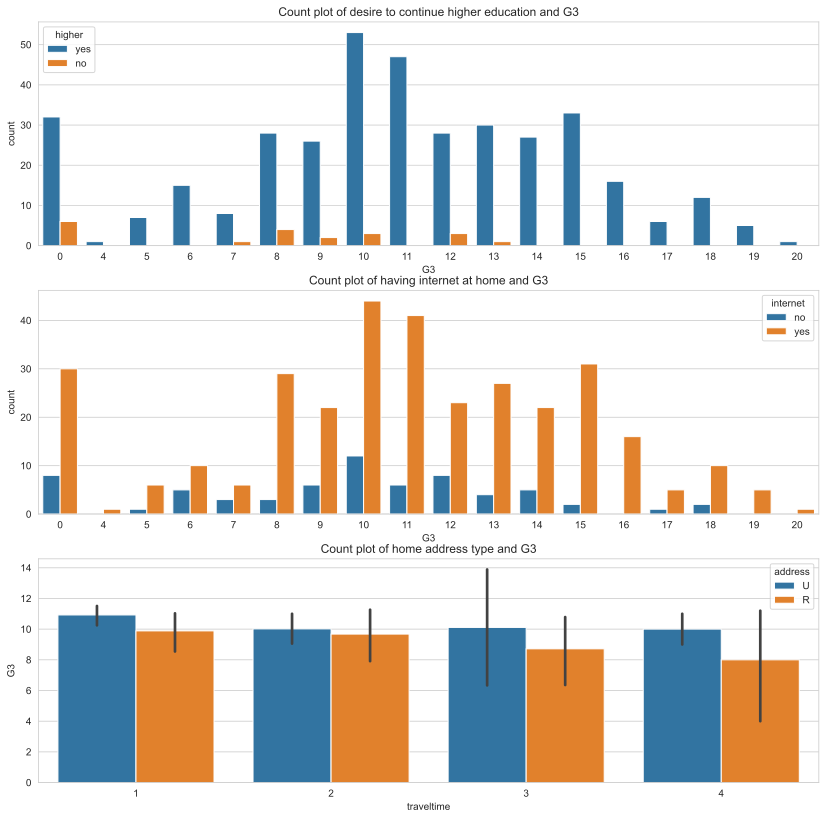

In [54]:
#your code for the first plot goes here! Take care that you import all classes/functions you need. Do not use different modules than matplotlib, pandas, seaborn for plotting
fg, axs = plt.subplots(3, 1, figsize=(14,14))

axs[0].set_title('Count plot of desire to continue higher education and G3')
sns.countplot(x='G3', hue='higher', data=data, ax=axs[0])

axs[1].set_title('Count plot of having internet at home and G3')
sns.countplot(x='G3', hue='internet', data=data, ax=axs[1])

axs[2].set_title('Count plot of home address type and G3')
sns.barplot(x='traveltime', y='G3', hue='address', data=data, ax=axs[2])


**1.5.** Use the Markdown-cell below to briefly justify your choice!

I then would like to see different effects of different binary predictors on G3. I plot 3 of them; desire to continue higher education, having internet at home and home address type/travel time together.

**1.6.** Use the Markdown-cell below to briefely discuss your plot!

Clearly the desire to continue higher education means more studying and better final grades. Also, having internet at home seems to be helpful for students in studying and thus getting better grades. Lastly, i wanted to see the effect of living in rural or urban areas. It might be better to consider looking at travel time in the same time since student living in rural areas might take more travel time which can affect their study time and grades, presuming that schools are located in urban areas. However and from the bar plot in figure 3, it turns out that this presumption is wrong. For example, students with travel time of 3 and 4 hours are more living in urban areas than in rural areas. With respect to grades "G3", it seems that studentis living in urban are more likely to get better final grades than those living in rural areas. Also students living in rural areas will get worse grades when they take more time to travel, something that urban students seem to be not facing.

Encoding and Splitting

In [113]:
le = LabelEncoder()
for column in data[["school", "sex", "address", "famsize", "Pstatus",
                  "Mjob", "Fjob", "reason", "guardian", "schoolsup",
                  "famsup", "paid", "activities", "nursery", "higher",
                  "internet", "romantic"]].columns:
    
    data[column] = le.fit_transform(data[column].values)

In [300]:
train, test = train_test_split(data,test_size=0.33, random_state=42)
X_train = train.iloc[:, :-1]
Y_train = train.iloc[:, -1:]
X_test = test.iloc[:, :-1]
Y_test = test.iloc[:, -1:]

### Task 2: Process/Pipeline and Parameter Search

In this task we provide the process/pipeline and parameter search as it was covered in the lecture. Your job in the course of this task will be to change blocks/models/parameters of this process. For most of the steps we have already provided the code below. Your task is mainly to select and define other scalers, models etc. Only one parameter/block will be changed in each experiment. This will not capture interactions between the different settings, but this limitation will make it easier for you to observe and discuss the results.

First the definition of the approach from the lecture is provided to serve as "default".

In [214]:
scx = StandardScaler()
scy = StandardScaler()
reg = Ridge()
cv = KFold(n_splits=10,shuffle=True,random_state=1)
space = dict()
space['regressor__regression__solver'] = ['svd', 'cholesky', 'lsqr', 'sag']
space['regressor__regression__alpha'] = [1e-4, 1e-3,5e-3, 1e-2, 5e-2, 1e-1,5e-1, 1,2,5,10,20,50, 100, 200]

Definition of the default pipeline.

In [215]:
# prepare the model pipeline
pipe = Pipeline([('scaler', scx), 
                 ('regression', reg)])
model = TransformedTargetRegressor(regressor=pipe, transformer=scy)

Let's  define and run the grid search and plot the results.

In [216]:
gs = GridSearchCV(model, space, scoring='neg_root_mean_squared_error', n_jobs=-1, cv=cv, refit=True)

In [217]:
gs.fit(X_train,Y_train)

GridSearchCV(cv=KFold(n_splits=10, random_state=1, shuffle=True),
             estimator=TransformedTargetRegressor(regressor=Pipeline(steps=[('scaler',
                                                                             StandardScaler()),
                                                                            ('regression',
                                                                             Ridge())]),
                                                  transformer=StandardScaler()),
             n_jobs=-1,
             param_grid={'regressor__regression__alpha': [0.0001, 0.001, 0.005,
                                                          0.01, 0.05, 0.1, 0.5,
                                                          1, 2, 5, 10, 20, 50,
                                                          100, 200],
                         'regressor__regression__solver': ['svd', 'cholesky',
                                                           'lsqr', 'sag']},
    

Now we can observe the results, which should look identical (or at least very similar) to the ones from the lecture.

In [218]:
print("Best CV-RMSE: {:.2f}".format(-gs.best_score_))
print(gs.best_params_)

Best CV-RMSE: 1.84
{'regressor__regression__alpha': 5, 'regressor__regression__solver': 'cholesky'}


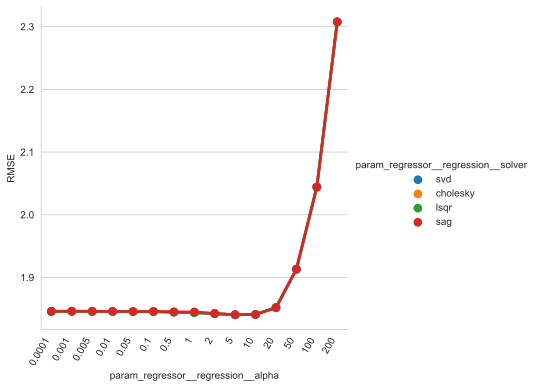

In [219]:
results = pd.DataFrame(gs.cv_results_)
cp = sns.catplot(x="param_regressor__regression__alpha", y=-results.mean_test_score, hue="param_regressor__regression__solver", kind="point", data=results)
cp.set_ylabels('RMSE')
cp.set_xticklabels(rotation = 60, ha="right")

**2.1.** This is the main task in this section. In the cell below you have to define all your scalers/preprocessors, as well as an alternative crossvalidation method and an alternative regression model with the appropriate parameter space. These definitions will then be used and executed in the next tasks.

In [245]:
# your imports go here 
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Lasso
from sklearn.model_selection import LeaveOneOut
from sklearn.preprocessing import QuantileTransformer, PowerTransformer

#change scaler, regression algorithm, cross-validation and parameter space
cv_own = LeaveOneOut()
scx_own = PolynomialFeatures(degree=2)
scy_own = PowerTransformer()
reg_own = Lasso()
space_own = dict() ### PLEASE CONSIDER THAT YOUR CLASSMATES REVIEWING THIS MIGHT NOT HAVE POWERFULL COMPUTING HARDWARE!
space_own['regressor__regression__selection'] = ['cyclic', 'random']
space_own['regressor__regression__max_iter'] = [500,1000,1500,2000]
space_own['regressor__regression__alpha'] = [1e-4, 1e-3,5e-3, 1e-2, 5e-2, 1e-1,5e-1, 1,2,5,10,20,50, 100, 200,400,600,800,1000]


# prepare the model pipeline
pipe_own = Pipeline([('scaler', scx_own), 
                 ('regression', reg_own)])
model_own = TransformedTargetRegressor(regressor=pipe_own, transformer=scy_own)

#### Experiment A: Conduct a grid search with the default process except for your alternative cross-validation.

**2.2.** Briefly justify your choice of an alternative cross-validation method!

Since we have very small data set (almost 395 observations), i would use all data for training and testing. I use LeaveOneOut so that all sets are used for training except one which is left for testing every iteration.

Let's  define and run the grid search and plot the results.

In [220]:
gs_own_cv = GridSearchCV(model, space, scoring='neg_root_mean_squared_error', n_jobs=-1, cv=cv_own, refit='True')

In [221]:
gs_own_cv.fit(X_train, Y_train)

GridSearchCV(cv=LeaveOneOut(),
             estimator=TransformedTargetRegressor(regressor=Pipeline(steps=[('scaler',
                                                                             StandardScaler()),
                                                                            ('regression',
                                                                             Ridge())]),
                                                  transformer=StandardScaler()),
             n_jobs=-1,
             param_grid={'regressor__regression__alpha': [0.0001, 0.001, 0.005,
                                                          0.01, 0.05, 0.1, 0.5,
                                                          1, 2, 5, 10, 20, 50,
                                                          100, 200],
                         'regressor__regression__solver': ['svd', 'cholesky',
                                                           'lsqr', 'sag']},
             refit='True', scoring='neg

In [222]:
print("Best CV-RMSE: {:.2f}".format(-gs_own_cv.best_score_))
print(gs_own_cv.best_params_)

Best CV-RMSE: 1.27
{'regressor__regression__alpha': 10, 'regressor__regression__solver': 'cholesky'}


Visualizaton of the results by plotting the RMSE vs. the hyper-parameters.

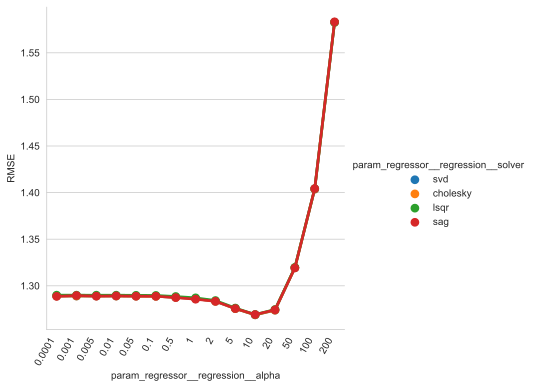

In [223]:
results_own_cv = pd.DataFrame(gs_own_cv.cv_results_)
cp = sns.catplot(x="param_regressor__regression__alpha", y=-results_own_cv.mean_test_score, hue="param_regressor__regression__solver", kind="point", data=results_own_cv)
cp.set_ylabels('RMSE')
cp.set_xticklabels(rotation = 60, ha="right")

**2.3** Use the Markdown-cell below to briefely discuss the results of the grid search and address potential differences to the default process!

The CV rmse has decreased significantly now. The model might be having higher variance (overfitting) now after getting trained on the entire data set and we might need to regularize it. 

#### Experiment B: Conduct a grid search with the default process except for your alternative x-scaler.

**2.4.** Briefly justify your choice of an alternative scaler/preprocessor for the feature matrix _X_!

I induce polynomial terms to allow more complex regression model (polynomial regression). I choose a second degree polynomial.

Let's  define and run the grid search and plot the results.

In [224]:
# prepare the model pipeline with your own x-scaler, default regression and default y-scaler
pipe_own_x = Pipeline([('scaler', scx_own), 
                 ('regression', reg)])
model_own_x = TransformedTargetRegressor(regressor=pipe_own_x, transformer=scy)

In [225]:
gs_own_x = GridSearchCV(model_own_x, space, scoring='neg_root_mean_squared_error', n_jobs=-1, cv=cv, refit=True)

In [226]:
gs_own_x.fit(X_train, Y_train)

GridSearchCV(cv=KFold(n_splits=10, random_state=1, shuffle=True),
             estimator=TransformedTargetRegressor(regressor=Pipeline(steps=[('scaler',
                                                                             PolynomialFeatures()),
                                                                            ('regression',
                                                                             Ridge())]),
                                                  transformer=StandardScaler()),
             n_jobs=-1,
             param_grid={'regressor__regression__alpha': [0.0001, 0.001, 0.005,
                                                          0.01, 0.05, 0.1, 0.5,
                                                          1, 2, 5, 10, 20, 50,
                                                          100, 200],
                         'regressor__regression__solver': ['svd', 'cholesky',
                                                           'lsqr', 'sag']},


In [227]:
print("Best CV-RMSE: {:.2f}".format(-gs_own_x.best_score_))
print(gs_own_x.best_params_)

Best CV-RMSE: 1.72
{'regressor__regression__alpha': 0.5, 'regressor__regression__solver': 'sag'}


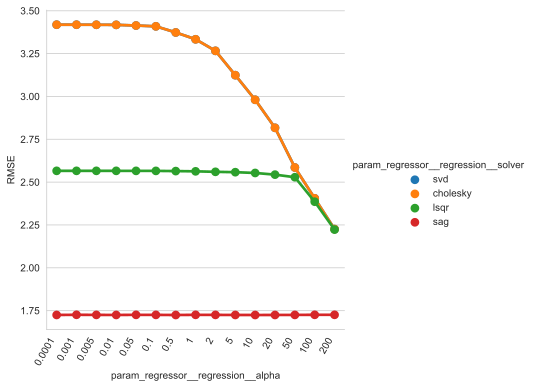

In [228]:
results_own_x = pd.DataFrame(gs_own_x.cv_results_)
cp = sns.catplot(x="param_regressor__regression__alpha", y=-results_own_x.mean_test_score, hue="param_regressor__regression__solver", kind="point", data=results_own_x)
cp.set_ylabels('RMSE')
cp.set_xticklabels(rotation = 60, ha="right")

**2.5** Use the Markdown-cell below to briefely discuss the results of the grid search and address potential differences to the default process!

The model is behaving better than the original model (CV RMSE is 1.72 compared to 1.84 originally). Again it might be that the model is overfitting now and will need to penalize high variance. It seems also that stochastic average gradient descent solver is already converged compared to others which looks like they need to be regularized more with higher alpha values to converge as well.

#### Experiment C: Conduct a grid search with the default process except for your alternative y-scaler.

**2.6.** Briefly justify your choice of an alternative scaler/preprocessor for the labels vector _y_!

To get a target "G3" which is more uniformly distribution, which is expected for students grades, i apply power transformation as transformedtargetregressor. This transformation makes data more gaussian-like. Additionally, it scales data into 0 mean and a unit-variance normalization.

Let's  define and run the grid search and plot the results.

In [235]:
pipe_own_y = Pipeline([('scaler', scx), 
                 ('regression', reg)])
model_own_y = TransformedTargetRegressor(regressor=pipe_own_y, transformer=scy_own)

In [236]:
gs_own_y = GridSearchCV(model_own_y, space, scoring='neg_root_mean_squared_error', n_jobs=-1, cv=cv, refit=True)

In [237]:
gs_own_y.fit(X_train, Y_train)

GridSearchCV(cv=KFold(n_splits=10, random_state=1, shuffle=True),
             estimator=TransformedTargetRegressor(regressor=Pipeline(steps=[('scaler',
                                                                             StandardScaler()),
                                                                            ('regression',
                                                                             Ridge())]),
                                                  transformer=PowerTransformer()),
             n_jobs=-1,
             param_grid={'regressor__regression__alpha': [0.0001, 0.001, 0.005,
                                                          0.01, 0.05, 0.1, 0.5,
                                                          1, 2, 5, 10, 20, 50,
                                                          100, 200],
                         'regressor__regression__solver': ['svd', 'cholesky',
                                                           'lsqr', 'sag']},
  

In [238]:
print("Best CV-RMSE: {:.2f}".format(-gs_own_y.best_score_))
print(gs_own_y.best_params_)

Best CV-RMSE: 1.84
{'regressor__regression__alpha': 20, 'regressor__regression__solver': 'svd'}


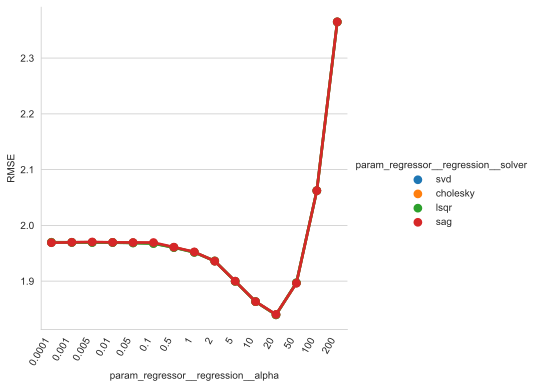

In [239]:
results_own_y = pd.DataFrame(gs_own_y.cv_results_)
cp = sns.catplot(x="param_regressor__regression__alpha", y=-results_own_y.mean_test_score, hue="param_regressor__regression__solver", kind="point", data=results_own_y)
cp.set_ylabels('RMSE')
cp.set_xticklabels(rotation = 60, ha="right")

**2.7** Use the Markdown-cell below to briefely discuss the results of the grid search and address potential differences to the default process!

CV RMSE is almost same behavior, at the optimum alpha, compared to standard scaling of target dependenet variable.

#### Experiment D: Conduct a grid search with the default process except for your alternative model AND parameter space.

**2.8.** Briefly justify your choice of an alternative regression model.

Since i chose a polynomial regression model, lots of parameters will be induced now from original features. Lasso regression can set some parameters to 0 and thus eliminating their effect. This might be needed since lots of features (predicting variables) were either redundant or might not be contributing in prediction.

**2.9.** Briefly explain your choice of hyper-parameters and search space that you want to train it on.

I select my search space to have both 'cyclic' and 'random' for updating of coefficients. The differece is that in 'cyclic' setting, feature coefficients will be updated sequentially while in 'random' they will be updated randomly. The randomness leads to faster convergence usually.
Next i stretch the maximum iterations range from 500 till 2000 to see whether having more iterations will lead to convergence at better results.
I also choose wide range of alpha parameter for regularization since now the model is more complex and there is a higher chance of overfitting if not penalized. 






Let's define and run the grid search and plot the results.

In [246]:
pipe_own_r = Pipeline([('scaler', scx), 
                 ('regression', reg_own)])
model_own_r = TransformedTargetRegressor(regressor=pipe_own_r, transformer=scy)

In [247]:
gs_own_r = GridSearchCV(model_own_r, space_own, scoring='neg_root_mean_squared_error', n_jobs=-1, cv=cv, refit=True)

In [248]:
gs_own_r.fit(X_train, Y_train)

GridSearchCV(cv=KFold(n_splits=10, random_state=1, shuffle=True),
             estimator=TransformedTargetRegressor(regressor=Pipeline(steps=[('scaler',
                                                                             StandardScaler()),
                                                                            ('regression',
                                                                             Lasso())]),
                                                  transformer=StandardScaler()),
             n_jobs=-1,
             param_grid={'regressor__regression__alpha': [0.0001, 0.001, 0.005,
                                                          0.01, 0.05, 0.1, 0.5,
                                                          1, 2, 5, 10, 20, 50,
                                                          100, 200, 400, 600,
                                                          800, 1000],
                         'regressor__regression__max_iter': [500, 1000, 1500,
 

In [249]:
print("Best CV-RMSE: {:.2f}".format(-gs_own_r.best_score_))
print(gs_own_r.best_params_)

Best CV-RMSE: 1.72
{'regressor__regression__alpha': 0.05, 'regressor__regression__max_iter': 2000, 'regressor__regression__selection': 'random'}


**2.10.** Create a plot similar to the ones above. In the case of testing an alternative model, the code is not provided, as we do not know beforehand which parameters will be used. If you have a high number of different parameters, think of another representation to visualize your results. 

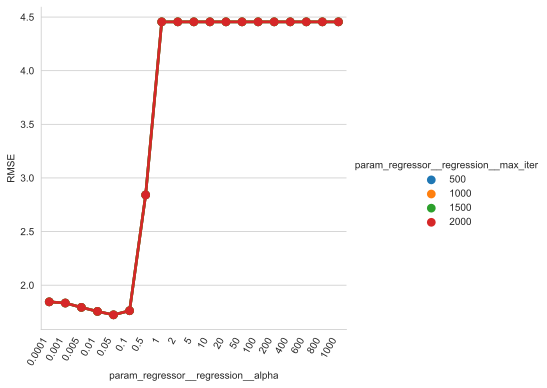

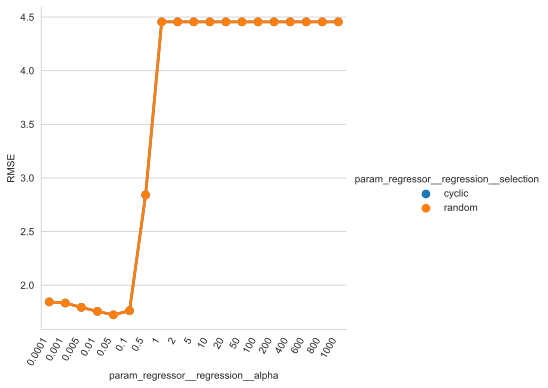

In [250]:
results_own_r = pd.DataFrame(gs_own_r.cv_results_)
# own visualization due to different hyper-parameters

### MY SOLUTION
cp = sns.catplot(x="param_regressor__regression__alpha", y=-results_own_r.mean_test_score, hue="param_regressor__regression__max_iter", kind="point", data=results_own_r)
cp.set_ylabels('RMSE')
cp.set_xticklabels(rotation = 60, ha="right")

cp = sns.catplot(x="param_regressor__regression__alpha", y=-results_own_r.mean_test_score, hue="param_regressor__regression__selection", kind="point", data=results_own_r)
cp.set_ylabels('RMSE')
cp.set_xticklabels(rotation = 60, ha="right")


**2.11.** Use the Markdown-cell below to briefely discuss the results of the grid search and address potential differences to the default process!

Seems like the model is performing better, lower bias, than original model. Also, high values of alpha lead to increasing bias and causing worse CV RMSE. Coefficients updating seems to have almost no impact similar to number of iterations as well.

#### Experiment E: Conduct a grid search with your favorite process by arbitrarily combining the blocks/parameters from your experiments A-D

**2.12.** Briefly justify your choice of the favorite process!

I hereby combine all the choices from before since each on its own has shown better results compared to original mode. I am going with a 2nd degree polynomial Lasso regression model. With LeaveOneOut cross validator and transforming dependent variable by a power transformer.

Let's define and run the grid search and plot the results.

In [257]:
gs_own_fav = GridSearchCV(model_own_fav, space_own , scoring='neg_root_mean_squared_error', n_jobs=-1, cv=cv_own, refit=True)

In [258]:
gs_own_fav.fit(X_train, Y_train)

GridSearchCV(cv=LeaveOneOut(),
             estimator=TransformedTargetRegressor(regressor=Pipeline(steps=[('scaler',
                                                                             PolynomialFeatures()),
                                                                            ('regression',
                                                                             Lasso())]),
                                                  transformer=PowerTransformer()),
             n_jobs=-1,
             param_grid={'regressor__regression__alpha': [0.0001, 0.001, 0.005,
                                                          0.01, 0.05, 0.1, 0.5,
                                                          1, 2, 5, 10, 20, 50,
                                                          100, 200, 400, 600,
                                                          800, 1000],
                         'regressor__regression__max_iter': [500, 1000, 1500,
                              

In [311]:
print("Best CV-RMSE: {:.2f}".format(-gs_own_fav.best_score_))
print(gs_own_fav.best_params_)

Best CV-RMSE: 1.09
{'regressor__regression__alpha': 1, 'regressor__regression__max_iter': 500, 'regressor__regression__selection': 'random'}


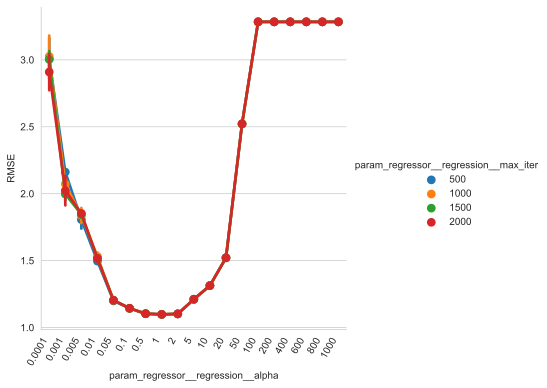

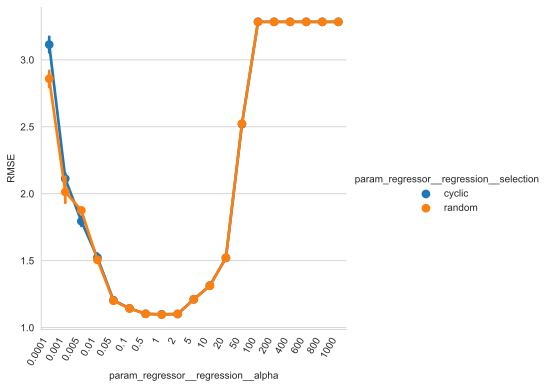

In [261]:
results_own_fav = pd.DataFrame(gs_own_fav.cv_results_)
# own visualization due to different hyper-parameters
cp = sns.catplot(x="param_regressor__regression__alpha", y=-results_own_fav.mean_test_score, hue="param_regressor__regression__max_iter", kind="point", data=results_own_fav)
cp.set_ylabels('RMSE')
cp.set_xticklabels(rotation = 60, ha="right")

cp = sns.catplot(x="param_regressor__regression__alpha", y=-results_own_fav.mean_test_score, hue="param_regressor__regression__selection", kind="point", data=results_own_fav)
cp.set_ylabels('RMSE')
cp.set_xticklabels(rotation = 60, ha="right")


Results show that CV-RMSE has now dropped to 1.09 (1.8 in original model). The best model has a regularization parameter of 
1 and maximum iterations of 500. Updating coefficients is done randomly.

### Task 3: Prediction without intermediate grades G1 and G2
The performance of the models above is likely to be influenced by the intermediate grades `G1` and `G2`. But what if we want to make our prediction in the begining of the class - without having those intermediate grades at hand? 

**3.1.** Remove the features `G1` and `G2` from the predictors `X_train` and `X_test`!

In [309]:
X_train

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2
172,0,1,17,1,1,1,4,4,4,2,...,0,4,4,4,1,3,5,0,13,11
119,0,1,15,1,0,1,3,4,2,2,...,0,3,4,3,1,2,4,6,14,13
389,1,0,18,1,0,1,1,1,2,2,...,0,1,1,1,1,1,5,0,6,5
198,0,0,17,1,0,1,4,4,3,4,...,0,4,2,4,2,3,2,24,18,18
139,0,0,15,1,0,1,4,4,4,4,...,0,4,3,2,1,1,5,0,16,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,0,1,15,1,0,1,4,2,2,2,...,0,3,3,3,1,1,3,0,10,10
106,0,0,15,1,0,1,2,2,2,2,...,0,5,1,2,1,1,3,8,7,8
270,0,0,19,1,0,1,3,3,2,3,...,0,4,3,5,3,3,5,15,9,9
348,0,0,17,1,0,1,4,3,1,2,...,1,4,4,3,1,3,4,0,13,15


In [302]:
X_train1 = X_train.drop(['G1','G2'], axis=1)
X_test1 = X_test.drop(['G1','G2'], axis=1)

In [303]:
X_train1

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences
172,0,1,17,1,1,1,4,4,4,2,...,1,1,0,4,4,4,1,3,5,0
119,0,1,15,1,0,1,3,4,2,2,...,1,1,0,3,4,3,1,2,4,6
389,1,0,18,1,0,1,1,1,2,2,...,1,0,0,1,1,1,1,1,5,0
198,0,0,17,1,0,1,4,4,3,4,...,1,1,0,4,2,4,2,3,2,24
139,0,0,15,1,0,1,4,4,4,4,...,1,1,0,4,3,2,1,1,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,0,1,15,1,0,1,4,2,2,2,...,1,1,0,3,3,3,1,1,3,0
106,0,0,15,1,0,1,2,2,2,2,...,1,1,0,5,1,2,1,1,3,8
270,0,0,19,1,0,1,3,3,2,3,...,1,1,0,4,3,5,3,3,5,15
348,0,0,17,1,0,1,4,3,1,2,...,1,1,1,4,4,3,1,3,4,0


In [304]:
X_test1

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences
78,0,1,17,1,0,1,2,1,2,2,...,0,1,0,4,5,1,1,1,3,2
371,1,1,18,0,1,1,1,2,0,3,...,0,1,1,4,3,3,2,3,3,3
248,0,1,18,0,1,1,3,3,2,3,...,1,1,1,4,3,3,1,3,5,8
55,0,0,16,1,0,0,2,1,2,2,...,1,1,1,5,3,4,1,1,2,8
390,1,1,20,1,1,0,2,2,3,3,...,1,0,0,5,5,4,4,5,4,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
246,0,1,17,1,0,1,2,3,2,2,...,1,1,0,5,2,2,1,1,2,4
239,0,1,18,1,0,1,2,2,2,3,...,0,1,0,5,5,4,3,5,2,0
153,0,1,19,1,0,1,3,2,3,0,...,0,1,1,4,5,4,1,1,4,0
261,0,1,18,1,0,1,4,3,4,2,...,1,1,0,4,3,2,1,1,3,2


We skip the search for the solver and go with the default value.

**3.2.** Change the search space for $\alpha$ if you think it is neccessary!

In [288]:
space1 = dict()
space1['regressor__regression__alpha'] = [1e-4, 1e-3,5e-3, 1e-2, 5e-2, 1e-1,5e-1, 1,2,5,10,20,50, 100, 200]

In [289]:
gs1 = GridSearchCV(model, space1, scoring='neg_root_mean_squared_error', n_jobs=-1, cv=cv, refit=True)
gs1.fit(X_train1, Y_train)

GridSearchCV(cv=KFold(n_splits=10, random_state=1, shuffle=True),
             estimator=TransformedTargetRegressor(regressor=Pipeline(steps=[('scaler',
                                                                             StandardScaler()),
                                                                            ('regression',
                                                                             Ridge())]),
                                                  transformer=StandardScaler()),
             n_jobs=-1,
             param_grid={'regressor__regression__alpha': [0.0001, 0.001, 0.005,
                                                          0.01, 0.05, 0.1, 0.5,
                                                          1, 2, 5, 10, 20, 50,
                                                          100, 200]},
             scoring='neg_root_mean_squared_error')

In [290]:
print("Best CV-RMSE: {:.2f}".format(-gs1.best_score_))
print(gs1.best_params_)

Best CV-RMSE: 4.24
{'regressor__regression__alpha': 200}


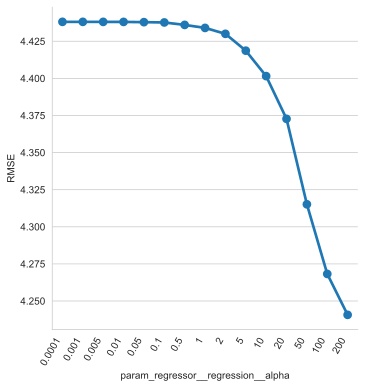

In [291]:
results1 = pd.DataFrame(gs1.cv_results_)
cp = sns.catplot(x="param_regressor__regression__alpha", y=-results1.mean_test_score, kind="point", data=results1)
cp.set_ylabels('RMSE')
cp.set_xticklabels(rotation = 60, ha="right")

**3.3.** Use the Markdown-cell below to briefely discuss the effect of leaving out `G1` and `G2`!

Leaving out G1 and G2 has affected the behaviour drastically and CV RMSE is almost 3x worse. It seems that the above models were very much dependent on G1 and G2 featues.

**3.4.** Now, try to predict `G3` solely on `G1` and `G2` by removing ALL other features from `X_train` and `X_test`!

In [306]:
X_train2 = X_train.drop(X_train.columns.difference(['G1','G2']),1)
X_test2 = X_test.drop(X_test.columns.difference(['G1','G2']),1)

In [307]:
X_train2

,G1,G2
172,13,11
119,14,13
389,6,5
198,18,18
139,16,16
...,...,...
71,10,10
106,7,8
270,9,9
348,13,15


In [308]:
X_test2

,G1,G2
78,8,8
371,14,12
248,3,5
55,8,9
390,9,9
...,...,...
246,12,12
239,7,7
153,5,0
261,8,8


In [295]:
gs2 = GridSearchCV(model, space1, scoring='neg_root_mean_squared_error', n_jobs=-1, cv=cv, refit=True)
gs2.fit(X_train2, Y_train)

GridSearchCV(cv=KFold(n_splits=10, random_state=1, shuffle=True),
             estimator=TransformedTargetRegressor(regressor=Pipeline(steps=[('scaler',
                                                                             StandardScaler()),
                                                                            ('regression',
                                                                             Ridge())]),
                                                  transformer=StandardScaler()),
             n_jobs=-1,
             param_grid={'regressor__regression__alpha': [0.0001, 0.001, 0.005,
                                                          0.01, 0.05, 0.1, 0.5,
                                                          1, 2, 5, 10, 20, 50,
                                                          100, 200]},
             scoring='neg_root_mean_squared_error')

In [296]:
print("Best CV-RMSE: {:.2f}".format(-gs2.best_score_))
print(gs2.best_params_)

Best CV-RMSE: 1.73
{'regressor__regression__alpha': 2}


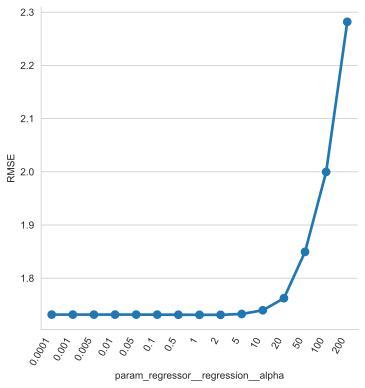

In [297]:
results2 = pd.DataFrame(gs2.cv_results_)
cp = sns.catplot(x="param_regressor__regression__alpha", y=-results2.mean_test_score, kind="point", data=results2)
cp.set_ylabels('RMSE')
cp.set_xticklabels(rotation = 60, ha="right")

**3.5.** Use the Markdown-cell below to briefely discuss your observation about the importance of `G1` and `G2`.

Using only G1 and G2 is performing better than using them with other features combined. This implies that other features are kind of misleading the model.

### Task 4: Final assessment of the best models on the test set

In this task the best performing/favorite models shall be run on the test set. It is very likely that the model, which uses only `G1` and `G2` as features, performes already quite good.

In [310]:
print('GS1-GS2 Model')
Y_pred_train2 = gs2.predict(X_train2)
Y_pred_test2 = gs2.predict(X_test2)
print("Training RMSE: {:.2f}".format(np.sqrt(mean_squared_error(Y_train, Y_pred_train2)))) 
print("Test RMSE: {:.2f}".format(np.sqrt(mean_squared_error(Y_test, Y_pred_test2))))
print("Training R2: {:.2f}".format(r2_score(Y_train, Y_pred_train2))) 
print("Test R2: {:.2f}".format(r2_score(Y_test, Y_pred_test2)))

print('-------')
print('Favorite Model')
Y_pred_train = gs_own_fav.predict(X_train)
Y_pred_test = gs_own_fav.predict(X_test)
print("Training RMSE: {:.2f}".format(np.sqrt(mean_squared_error(Y_train, Y_pred_train)))) 
print("Test RMSE: {:.2f}".format(np.sqrt(mean_squared_error(Y_test, Y_pred_test))))
print("Training R2: {:.2f}".format(r2_score(Y_train, Y_pred_train))) 
print("Test R2: {:.2f}".format(r2_score(Y_test, Y_pred_test)))

GS1-GS2 Model
Training RMSE: 1.85
Test RMSE: 2.09
Training R2: 0.83
Test R2: 0.80
-------
Favorite Model
Training RMSE: 1.81
Test RMSE: 2.05
Training R2: 0.84
Test R2: 0.81


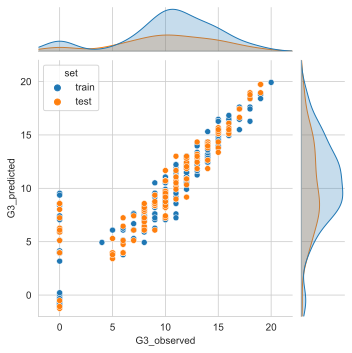

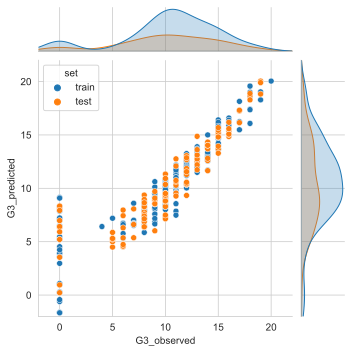

In [312]:
Ys2 = pd.DataFrame(data={'set': ['train']*len(Y_train),'G3_observed': Y_train.values.ravel(), 'G3_predicted': Y_pred_train2.ravel()})
Ys2 = Ys2.append(pd.DataFrame(data={'set': ['test']*len(Y_test),'G3_observed': Y_test.values.ravel(), 'G3_predicted': Y_pred_test2.ravel()}))
JG1 = sns.jointplot(data=Ys2,x='G3_observed',y='G3_predicted', hue='set', height=5,xlim=(-2,22), ylim=(-2,22))

Ys_own_fav = pd.DataFrame(data={'set': ['train']*len(Y_train),'G3_observed': Y_train.values.ravel(), 'G3_predicted': Y_pred_train.ravel()})
Ys_own_fav = Ys_own_fav.append(pd.DataFrame(data={'set': ['test']*len(Y_test),'G3_observed': Y_test.values.ravel(), 'G3_predicted': Y_pred_test.ravel()}))
JG2 = sns.jointplot(data=Ys_own_fav,x='G3_observed',y='G3_predicted', hue='set', height=5,xlim=(-2,22), ylim=(-2,22))

**4.1.** Use the Markdown-cell below to briefely discuss the difference you observe on the test set comparing the two models.

Running test set on both models shows that both of them are very much alike. There is almost no difference when observing the test set error metrics. Also from the 2 graphs, the predicted G3 distribution shape seems to match except for those who got 0 in G3 where the first model is slightly better at predicting G3 for students getting 0 grade. 

**4.2.** Which of the models would you sell to a customer and why?

I would use the second model and train it only on the G1 and G2 training data since they seem to be the most descisive predictors. 